# Get Statistics of Final Images

In [4]:
import numpy as np
from astropy.io import fits
from astropy.table import QTable
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from scipy.stats import norm, trim_mean
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from math import sin, cos, radians


In [5]:
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, Tcmb0=2.725 * u.K, Om0=0.3)

## Load Table Data

In [6]:
table1 = np.loadtxt("../tables/table1.csv", delimiter=",", dtype=str).T
table2 = np.loadtxt("../tables/table2.csv", delimiter=",", dtype=str).T
peaks = table1[9].astype(float)
blanks = table1[10].astype(float)
log_L_nu = table2[11].astype(float)
Lsgn = table2[10].astype(float)
L_nu = Lsgn * 10**log_L_nu * 1e-26
mean_L = np.nanmean(L_nu)
median_L = np.nanmedian(L_nu)
rmean_L = trim_mean(L_nu, 0.1)
mean_S = np.nanmean(peaks)
median_S = np.nanmedian(peaks)
rmean_S = trim_mean(peaks, 0.1)
mean_B = np.nanmean(blanks)
median_B = np.nanmedian(blanks)
rmean_B = trim_mean(blanks, 0.1)
mad = 1.4826 * np.nanmedian(np.abs(blanks - np.nanmedian(blanks)))

## Plot Histograms

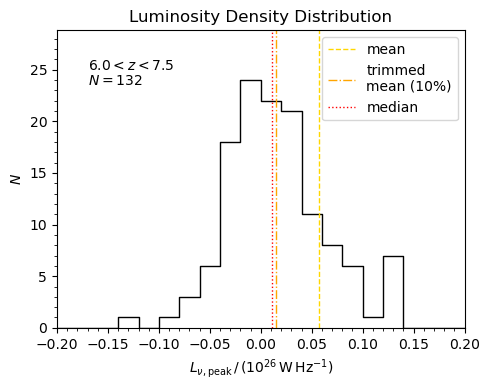

In [7]:
bins = np.arange(-4, 4, 0.02)
hist, binc = np.histogram(L_nu, bins, density=False)
binc = 0.5 * (binc[1:] + binc[1:])

fig = plt.figure(figsize=(5, 4))
plt.step(binc, hist, color="k", linewidth=1)
plt.vlines(mean_L, 0, 1.2 * np.max(hist), linewidth=1, linestyle="--", color="gold", label="mean")
plt.vlines(rmean_L, 0, 1.2 * np.max(hist), linewidth=1, linestyle="-.", color="orange", label="trimmed\nmean (10%)")
plt.vlines(median_L, 0, 1.2 * np.max(hist), linewidth=1, linestyle="dotted", color="red", label="median")
plt.xlim([-.2, .2])
plt.ylim([0.0, 1.2 * np.max(hist)])
plt.xlabel(r"$L_{\nu,\mathrm{peak}}\,/\,(10^{26}\, \mathrm{W\,Hz^{-1}})$")
plt.ylabel(r"$N$")
plt.title("Luminosity Density Distribution")
plt.text(-0.17, 25, rf"$6.0 < z < 7.5$")
plt.text(-0.17, 23.5, rf"$N={len(L_nu)}$")
plt.legend()
plt.minorticks_on()
plt.tight_layout()
plt.savefig("../../plots/lum_dist.png", dpi=600)


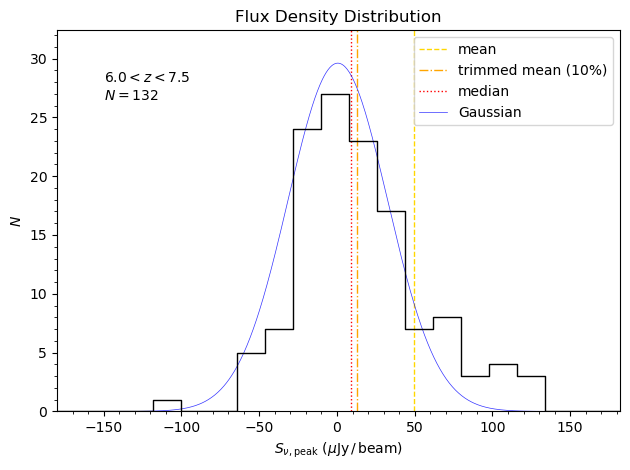

In [8]:
bins = np.arange(-1e3, 1e3, 18)
hist, binc = np.histogram(peaks, bins, density=False)
binc = 0.5 * (binc[1:] + binc[1:])

x = np.linspace(-2e2, 2e2, 1000)
y = norm.pdf(x, mean_B, mad) * len(blanks) * 18

plt.vlines(mean_S, 0, 1.2 * np.max(hist), linewidth=1, linestyle="--", color="gold", label="mean")
plt.vlines(rmean_S, 0, 1.2 * np.max(hist), linewidth=1, linestyle="-.", color="orange", label="trimmed mean (10%)")
plt.vlines(median_S, 0, 1.2 * np.max(hist), linewidth=1, linestyle="dotted", color="red", label="median")
plt.plot(x, y, linewidth=.5, alpha=.8, color="b", label="Gaussian")
plt.step(binc, hist, color="k", linewidth=1)
plt.xlim([-1.8e2, 1.82e2])
plt.ylim([0.0, 1.2 * np.max(hist)])
plt.xlabel(r"$S_{\nu,\mathrm{peak}}$ $(\mu\mathrm{Jy\,/\,beam})$")
plt.ylabel(r"$N$")
plt.title("Flux Density Distribution")
plt.text(-150, 28, rf"$6.0 < z < 7.5$")
plt.text(-150, 26.5, rf"$N={len(L_nu)}$")
plt.legend()
plt.minorticks_on()
plt.tight_layout()


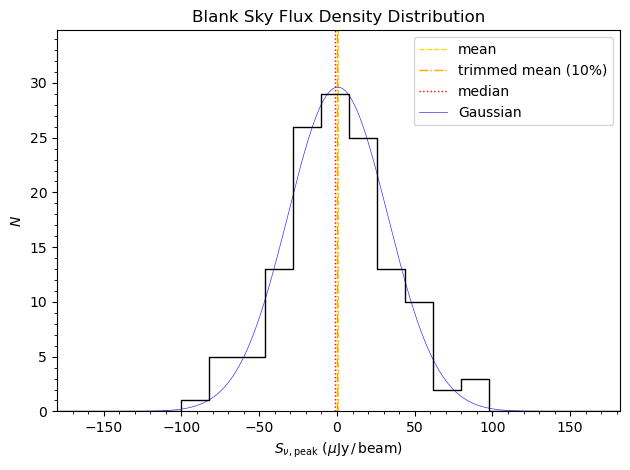

In [9]:
bins = np.arange(-1e3, 1e3, 18)
hist, binc = np.histogram(blanks, bins, density=False)
binc = 0.5 * (binc[1:] + binc[1:])

plt.vlines(mean_B, 0, 1.2 * np.max(hist), linewidth=1, linestyle="--", color="gold", label="mean")
plt.vlines(rmean_B, 0, 1.2 * np.max(hist), linewidth=1, linestyle="-.", color="orange", label="trimmed mean (10%)")
plt.vlines(median_B, 0, 1.2 * np.max(hist), linewidth=1, linestyle="dotted", color="red", label="median")
plt.plot(x, y, linewidth=.5, alpha=.8, color="b", label="Gaussian")
plt.step(binc, hist, color="k", linewidth=1)
plt.xlim([-1.8e2, 1.82e2])
plt.ylim([0.0, 1.2 * np.max(hist)])
plt.xlabel(r"$S_{\nu,\mathrm{peak}}$ $(\mu\mathrm{Jy\,/\,beam})$")
plt.ylabel(r"$N$")
plt.title("Blank Sky Flux Density Distribution")
plt.legend()
plt.minorticks_on()
plt.tight_layout()


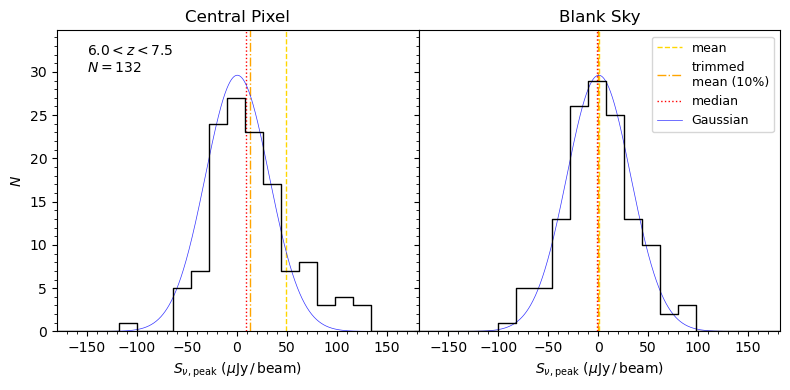

In [10]:
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(8, 4))

x = np.linspace(-2e2, 2e2, 1000)
y = norm.pdf(x, mean_B, mad) * len(blanks) * 18

bins = np.arange(-1e3, 1e3, 18)
hist, binc = np.histogram(peaks, bins, density=False)
binc = 0.5 * (binc[1:] + binc[1:])

ax[0].vlines(mean_S, 0, 2 * np.max(hist), linewidth=1, linestyle="--", color="gold", label="mean")
ax[0].vlines(rmean_S, 0, 2 * np.max(hist), linewidth=1, linestyle="-.", color="orange", label="trimmed mean (10%)")
ax[0].vlines(median_S, 0, 2 * np.max(hist), linewidth=1, linestyle="dotted", color="red", label="median")
ax[0].plot(x, y, linewidth=.5, alpha=.8, color="b", label="Gaussian")
ax[0].step(binc, hist, color="k", linewidth=1)
ax[0].set_xlim([-1.8e2, 1.82e2])
ax[0].set_ylim([0.0, 1.2 * np.max(hist)])
ax[0].set_xlabel(r"$S_{\nu,\mathrm{peak}}$ $(\mu\mathrm{Jy\,/\,beam})$")
ax[0].set_ylabel(r"$N$")
ax[0].set_title("Central Pixel")
ax[0].text(-150, 32, rf"$6.0 < z < 7.5$")
ax[0].text(-150, 30, rf"$N={len(L_nu)}$")
ax[0].minorticks_on()

bins = np.arange(-1e3, 1e3, 18)
hist, binc = np.histogram(blanks, bins, density=False)
binc = 0.5 * (binc[1:] + binc[1:])

ax[1].vlines(mean_B, 0, 2 * np.max(hist), linewidth=1, linestyle="--", color="gold", label="mean")
ax[1].vlines(rmean_B, 0, 2 * np.max(hist), linewidth=1, linestyle="-.", color="orange", label="trimmed\nmean (10%)")
ax[1].vlines(median_B, 0, 2 * np.max(hist), linewidth=1, linestyle="dotted", color="red", label="median")
ax[1].plot(x, y, linewidth=.5, alpha=.8, color="b", label="Gaussian")
ax[1].step(binc, hist, color="k", linewidth=1)
ax[1].set_xlim([-1.8e2, 1.82e2])
ax[1].set_ylim([0.0, 1.2 * np.max(hist)])
ax[1].set_xlabel(r"$S_{\nu,\mathrm{peak}}$ $(\mu\mathrm{Jy\,/\,beam})$")
ax[1].set_title("Blank Sky")
ax[1].legend(fontsize=9)
ax[1].minorticks_on()

plt.tight_layout()
fig.subplots_adjust(hspace=0, wspace=0)

plt.savefig("../../plots/flux_dist.png", dpi=600)

## Load Images

In [26]:
cell = 0.3 # arcsec
imdir = "/rds/user/pmk46/hpc-work/19A-056/final/images/*.fits"

def get_target_pixel(hdu, target_coord_str):
    # Extract the image data and header
    image_header = hdu.header

    # Create a WCS object from the FITS header
    wcs = WCS(image_header)

    # Convert the target coordinate to SkyCoord object
    target_coord = SkyCoord(target_coord_str, unit=(u.hourangle, u.deg))

    # Convert the target coordinate to pixel coordinates
    target_pixel = wcs.all_world2pix(target_coord.ra.deg, target_coord.dec.deg, 0, 0, 1)
    
    # Round the pixel coordinates to the nearest integer
    target_pixel = np.round(target_pixel).astype(int) - np.array([1, 1, 1, 1])

    return target_pixel

def get_cutout(data, cutout, pc):
    """ 
    Get a cutout of the centre of a 2D data array.
    """

    N = data.shape[0]

    nstart0 = max(pc[0] - cutout // 2, 0)
    nend0 = min(pc[0] + cutout // 2 + 1, N)
    nstart1 = max(pc[1] - cutout // 2, 0)
    nend1 = min(pc[1] + cutout // 2 + 1, N)

    return data[nstart0:nend0, nstart1:nend1]

images = []
images_large = []
bmin_list = []
bmax_list = []
pa_list = []

qso_catalog = QTable.read('../tables/Quasar_catalog_Banados+16_Matsuoka+19a_Matsuoka+19b_Wang+18_Wang+19_Reed+19_Yang+20.txt', format='ascii')

for name in table2[0]:
    catalog_name = list(name)
    catalog_name[3] = "_"
    catalog_name = "".join(catalog_name)

    # read QSO catalogue
    row = qso_catalog[qso_catalog["QSO-Name"] ==  catalog_name]
    ra = row["RA"].value[0]
    dec = row["Dec"].value[0]

    imfits = f"/rds/user/pmk46/hpc-work/19A-056/final/images/{name}-res.im-MFS-image.fits"
    hdu = fits.open(imfits)[0]
    bmin_list.append(hdu.header["BMIN"])
    bmax_list.append(hdu.header["BMAJ"])
    pa_list.append(hdu.header["BPA"])
    pc = get_target_pixel(hdu, f"{ra} {dec}")[[0, 1]]
    image_data = hdu.data[0, 0]

    if not np.isnan(image_data).any():
        images.append(get_cutout(image_data, 41, pc))
        images_large.append(get_cutout(image_data, 1024, pc))
    else:
        print(f"NaN in {imfits}!")

In [32]:
fluxpeaks = table2[2].astype(float)
fluxpeaks_err = table2[3].astype(float)
snr_amps = table1[12].astype(float)

i_det, i_ul = [], []

for i, snr in enumerate(snr_amps):
    if snr > 2.5:
        i_det.append(i)
    else:
        i_ul.append(i)

In [33]:
print(len(i_det))

23


## Plot Mean and Median Images

In [34]:
fluxpeaks = table2[2].astype(float)
fluxpeaks_err = table2[3].astype(float)
snr_amps = table1[12].astype(float)

i_det, i_ul = [], []

for i, (fp, fperr) in enumerate(zip(fluxpeaks, fluxpeaks_err)):
    if fp/fperr > 3:
        i_det.append(i)
    else:
        i_ul.append(i)

images = np.array(images)

median_im = np.nanmedian(images, axis=0)
mean_im = trim_mean(images, 0.1, axis=0)

median_mad = 1.4826 * np.median(np.abs(median_im - np.median(median_im)))
mean_mad = 1.4826 * np.median(np.abs(mean_im - np.median(mean_im)))

print(mean_mad, median_mad)

3.138199176873968e-06 3.943751490487557e-06


[-16. -13.  -9.  -6.   6.   9.  13.  16.]
[-20. -16. -12.  -8.   8.  12.  16.  20.]


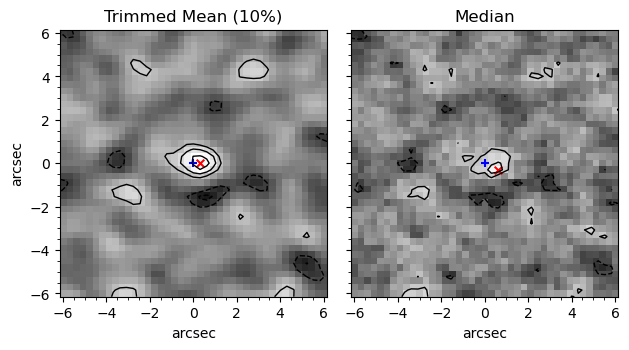

In [35]:
N = median_im.shape[0]

# Create a figure and axes
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True)

# Display the image
mad = mean_mad
im = ax[0].imshow(mean_im, cmap='gray', origin='lower', vmin=-4*mad, vmax=4*mad, extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]))

# Add contours to the image
contours_levels = [-5*mad, -4*mad, -3*mad, -2*mad, 2*mad, 3*mad, 4*mad, 5*mad] 
print((np.array(contours_levels)*1e6).round(0))

contours = ax[0].contour(mean_im, levels=contours_levels, linestyles=None, linewidths=1, negative_linestyles="dashed", colors="k", extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]))

max_x, max_y = np.unravel_index(np.argmax(mean_im), mean_im.shape)

ax[0].scatter(0, 0, marker='+', color='b', s=30)
ax[0].scatter((max_y-N//2)*0.3, (max_x-N//2)*0.3, marker='x', color='r', s=30)

# Add labels and title
ax[0].set_xlabel('arcsec')
ax[0].set_ylabel('arcsec')
ax[0].set_title("Trimmed Mean (10%)")
ax[0].minorticks_on()

# Display the image
mad = median_mad
im = ax[1].imshow(median_im, cmap='gray', origin='lower', vmin=-4*mad, vmax=4*mad, extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]))

# Add contours to the image
contours_levels = [-5*mad, -4*mad, -3*mad, -2*mad, 2*mad, 3*mad, 4*mad, 5*mad] 
print((np.array(contours_levels)*1e6).round(0))

contours = ax[1].contour(median_im, levels=contours_levels, linestyles=None, linewidths=1, negative_linestyles="dashed", colors="k", extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]))

max_x, max_y = np.unravel_index(np.argmax(median_im), median_im.shape)

ax[1].scatter(0, 0, marker='+', color='b', s=30)
ax[1].scatter((max_y-N//2)*0.3, (max_x-N//2)*0.3, marker='x', color='r', s=30)

# Add labels and title
ax[1].set_xlabel('arcsec')
ax[1].set_title("Median")
ax[1].minorticks_on()

ax[0].set_xticks(np.arange(-6, 8, 2))
ax[0].set_yticks(np.arange(-6, 8, 2))
ax[1].set_xticks(np.arange(-6, 8, 2))
ax[1].set_yticks(np.arange(-6, 8, 2))

plt.tight_layout()

# Show the plot
plt.savefig("../../plots/avg_im.png", dpi=600)
plt.show()


 ## Plot Cutouts

[-192. -154. -115.  -77.   77.  115.  154.  192.]
[-201. -161. -120.  -80.   80.  120.  161.  201.]
[-178. -142. -107.  -71.   71.  107.  142.  178.]
[-153. -122.  -92.  -61.   61.   92.  122.  153.]
[-156. -124.  -93.  -62.   62.   93.  124.  156.]
[-160. -128.  -96.  -64.   64.   96.  128.  160.]
[-182. -146. -109.  -73.   73.  109.  146.  182.]
[-152. -122.  -91.  -61.   61.   91.  122.  152.]
[-250. -200. -150. -100.  100.  150.  200.  250.]
[-162. -129.  -97.  -65.   65.   97.  129.  162.]
[-141. -113.  -84.  -56.   56.   84.  113.  141.]
[-149. -119.  -89.  -60.   60.   89.  119.  149.]
[-243. -194. -146.  -97.   97.  146.  194.  243.]
[-113.  -90.  -68.  -45.   45.   68.   90.  113.]
[-164. -131.  -98.  -66.   66.   98.  131.  164.]
[-213. -171. -128.  -85.   85.  128.  171.  213.]


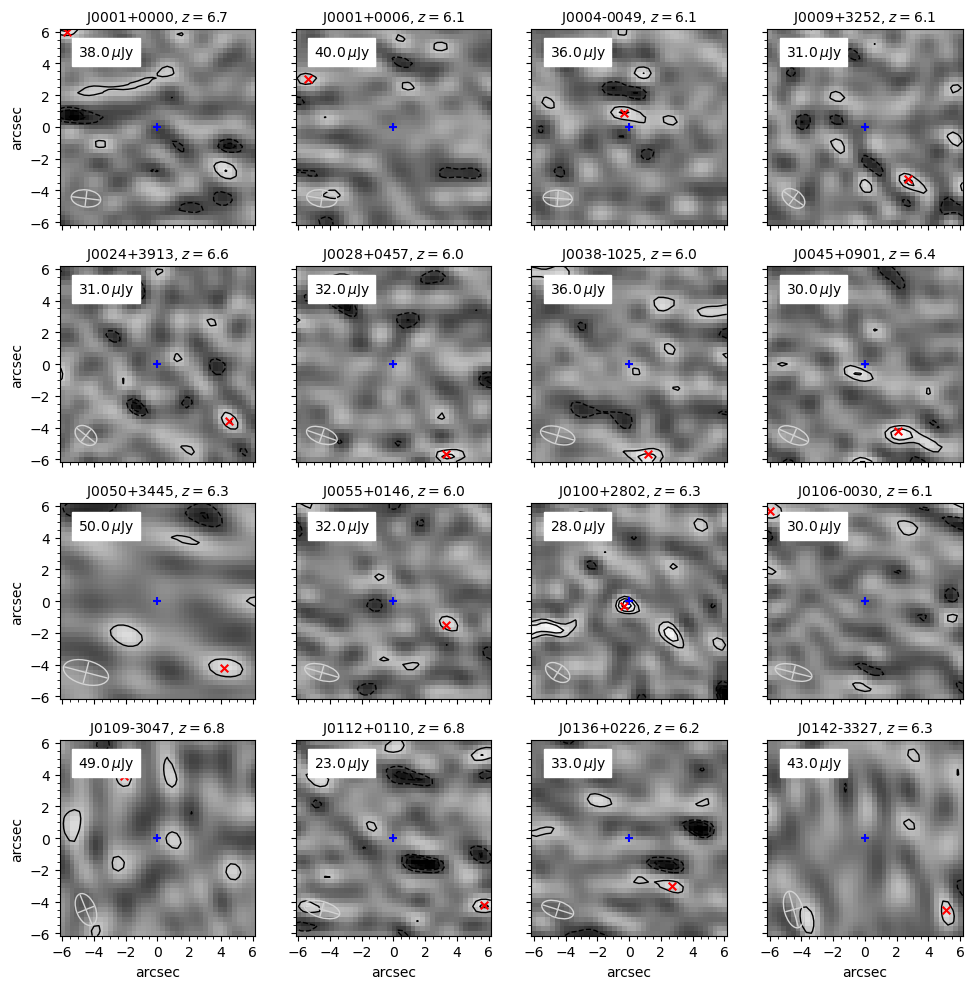

[-263. -211. -158. -105.  105.  158.  211.  263.]
[-183. -147. -110.  -73.   73.  110.  147.  183.]
[-156. -124.  -93.  -62.   62.   93.  124.  156.]
[-170. -136. -102.  -68.   68.  102.  136.  170.]
[-195. -156. -117.  -78.   78.  117.  156.  195.]
[-160. -128.  -96.  -64.   64.   96.  128.  160.]
[-185. -148. -111.  -74.   74.  111.  148.  185.]
[-145. -116.  -87.  -58.   58.   87.  116.  145.]
[-204. -163. -122.  -82.   82.  122.  163.  204.]
[-219. -175. -131.  -87.   87.  131.  175.  219.]
[-179. -143. -107.  -72.   72.  107.  143.  179.]
[-226. -181. -136.  -90.   90.  136.  181.  226.]
[-201. -161. -121.  -81.   81.  121.  161.  201.]
[-172. -138. -103.  -69.   69.  103.  138.  172.]
[-139. -111.  -84.  -56.   56.   84.  111.  139.]
[-228. -182. -137.  -91.   91.  137.  182.  228.]


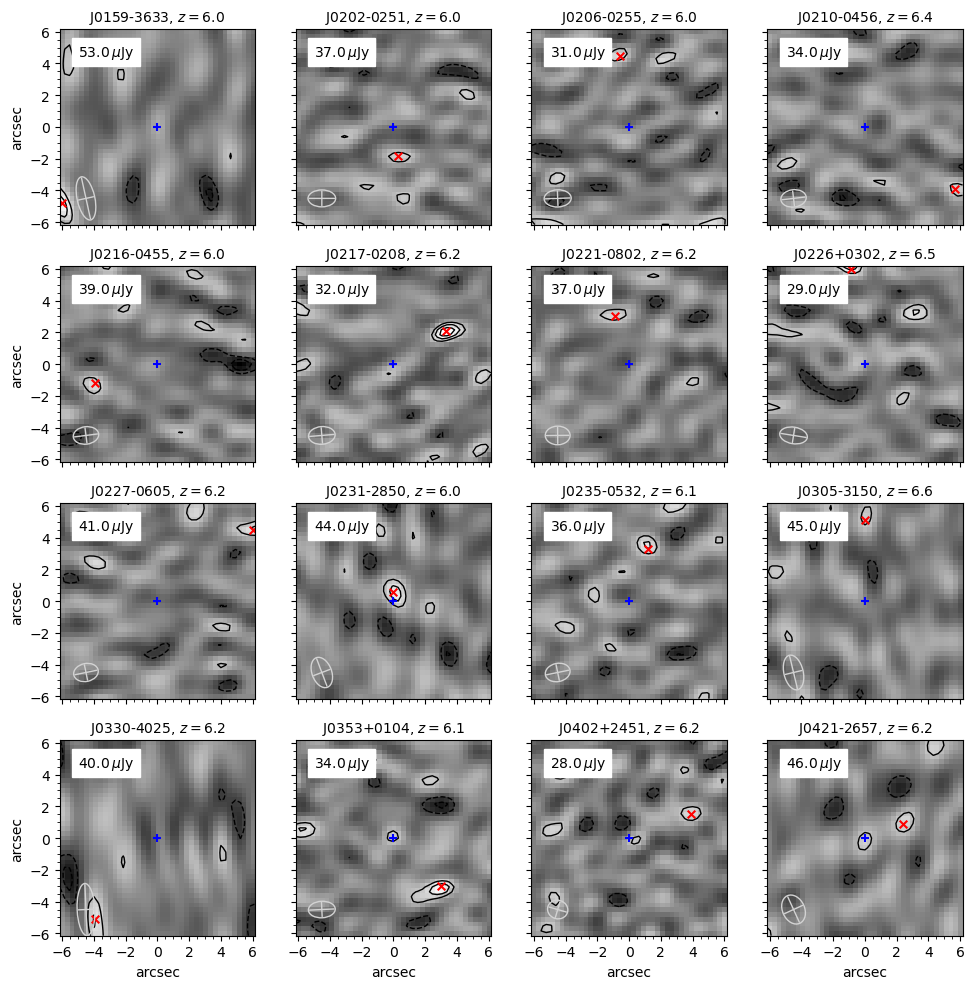

[-200. -160. -120.  -80.   80.  120.  160.  200.]
[-214. -171. -129.  -86.   86.  129.  171.  214.]
[-162. -130.  -97.  -65.   65.   97.  130.  162.]
[-182. -146. -109.  -73.   73.  109.  146.  182.]
[-194. -155. -116.  -77.   77.  116.  155.  194.]
[-180. -144. -108.  -72.   72.  108.  144.  180.]
[-180. -144. -108.  -72.   72.  108.  144.  180.]
[-167. -134. -100.  -67.   67.  100.  134.  167.]
[-162. -129.  -97.  -65.   65.   97.  129.  162.]
[-179. -143. -108.  -72.   72.  108.  143.  179.]
[-160. -128.  -96.  -64.   64.   96.  128.  160.]
[-164. -131.  -98.  -66.   66.   98.  131.  164.]
[-180. -144. -108.  -72.   72.  108.  144.  180.]
[-202. -161. -121.  -81.   81.  121.  161.  202.]
[-299. -239. -179. -120.  120.  179.  239.  299.]
[-195. -156. -117.  -78.   78.  117.  156.  195.]


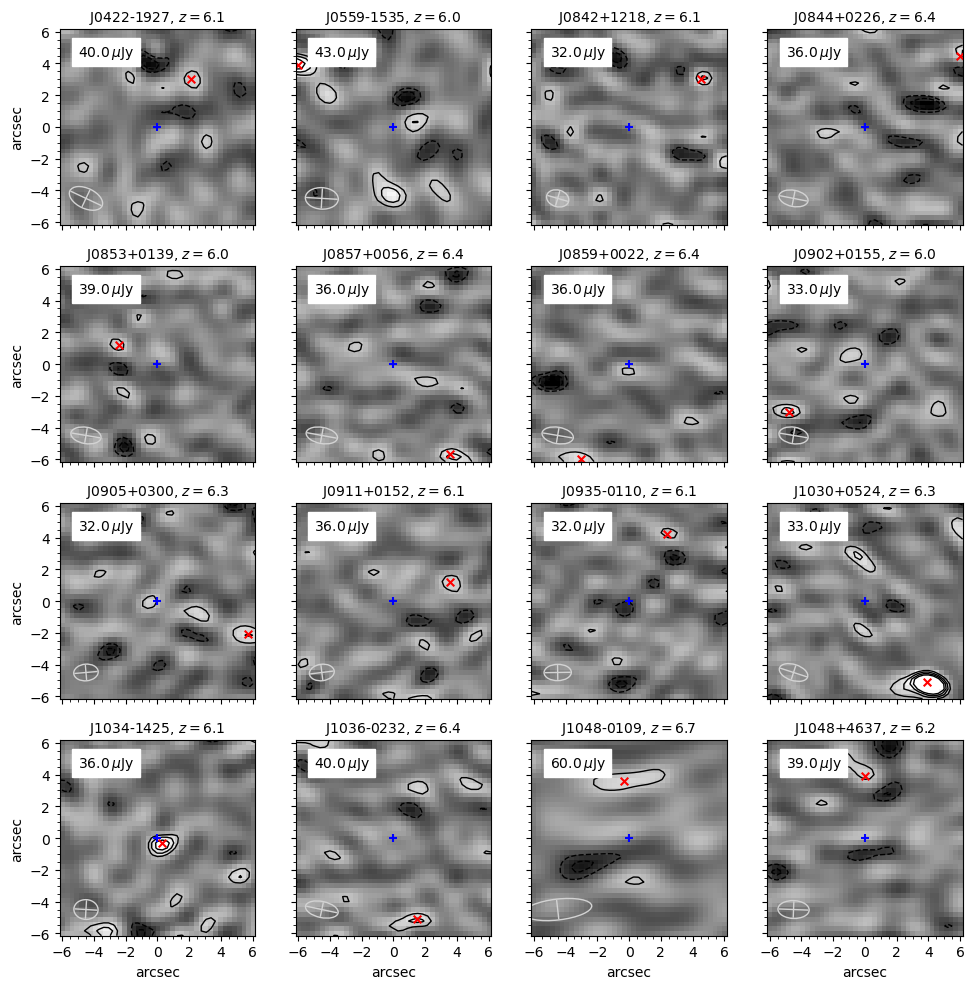

[-235. -188. -141.  -94.   94.  141.  188.  235.]
[-238. -190. -143.  -95.   95.  143.  190.  238.]
[-219. -175. -131.  -87.   87.  131.  175.  219.]
[-316. -253. -189. -126.  126.  189.  253.  316.]
[-187. -149. -112.  -75.   75.  112.  149.  187.]
[-220. -176. -132.  -88.   88.  132.  176.  220.]
[-182. -145. -109.  -73.   73.  109.  145.  182.]
[-187. -149. -112.  -75.   75.  112.  149.  187.]
[-199. -159. -120.  -80.   80.  120.  159.  199.]
[-218. -174. -131.  -87.   87.  131.  174.  218.]
[-204. -163. -122.  -81.   81.  122.  163.  204.]
[-205. -164. -123.  -82.   82.  123.  164.  205.]
[-269. -215. -161. -107.  107.  161.  215.  269.]
[-221. -177. -133.  -88.   88.  133.  177.  221.]
[-200. -160. -120.  -80.   80.  120.  160.  200.]
[-170. -136. -102.  -68.   68.  102.  136.  170.]


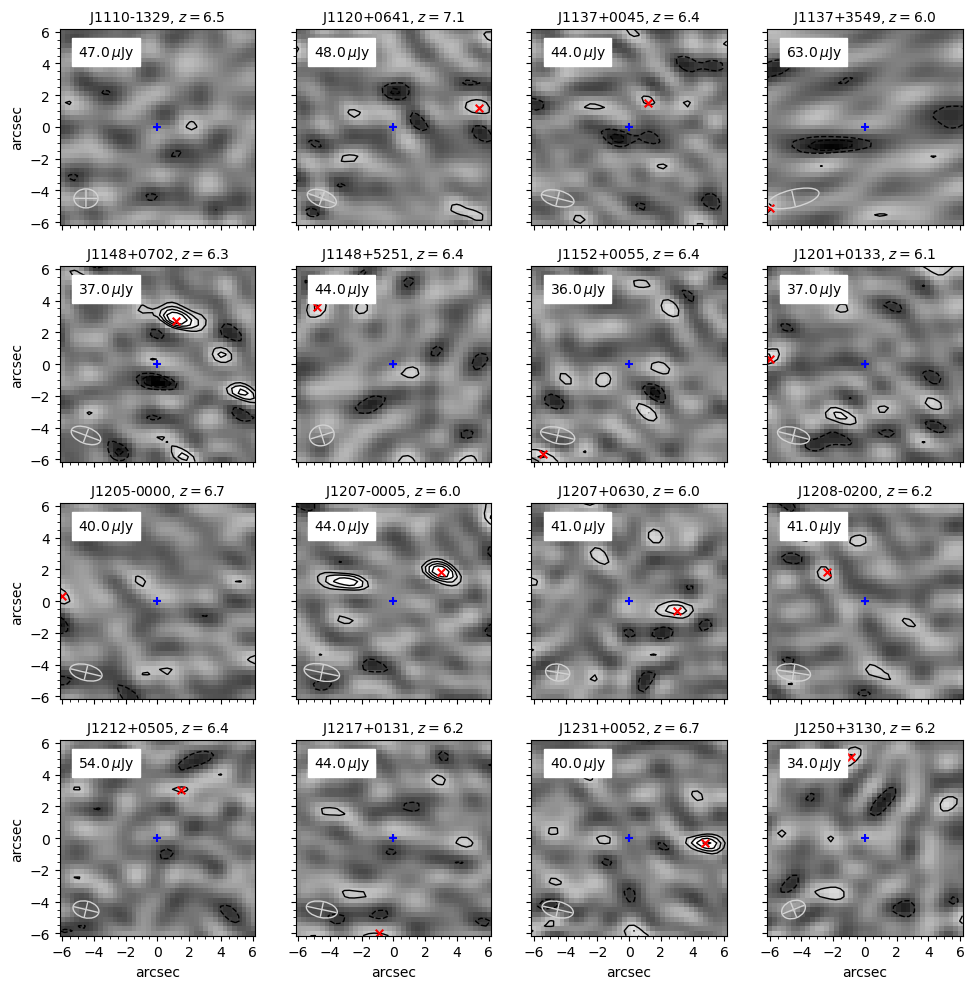

[-175. -140. -105.  -70.   70.  105.  140.  175.]
[-196. -157. -118.  -78.   78.  118.  157.  196.]
[-123.  -98.  -74.  -49.   49.   74.   98.  123.]
[-132. -106.  -79.  -53.   53.   79.  106.  132.]
[-143. -114.  -86.  -57.   57.   86.  114.  143.]
[-200. -160. -120.  -80.   80.  120.  160.  200.]
[-164. -131.  -99.  -66.   66.   99.  131.  164.]
[-168. -135. -101.  -67.   67.  101.  135.  168.]
[-187. -150. -112.  -75.   75.  112.  150.  187.]
[-189. -151. -113.  -76.   76.  113.  151.  189.]
[-178. -143. -107.  -71.   71.  107.  143.  178.]
[-210. -168. -126.  -84.   84.  126.  168.  210.]
[-160. -128.  -96.  -64.   64.   96.  128.  160.]
[-181. -145. -109.  -73.   73.  109.  145.  181.]
[-169. -135. -101.  -68.   68.  101.  135.  169.]
[-176. -141. -105.  -70.   70.  105.  141.  176.]


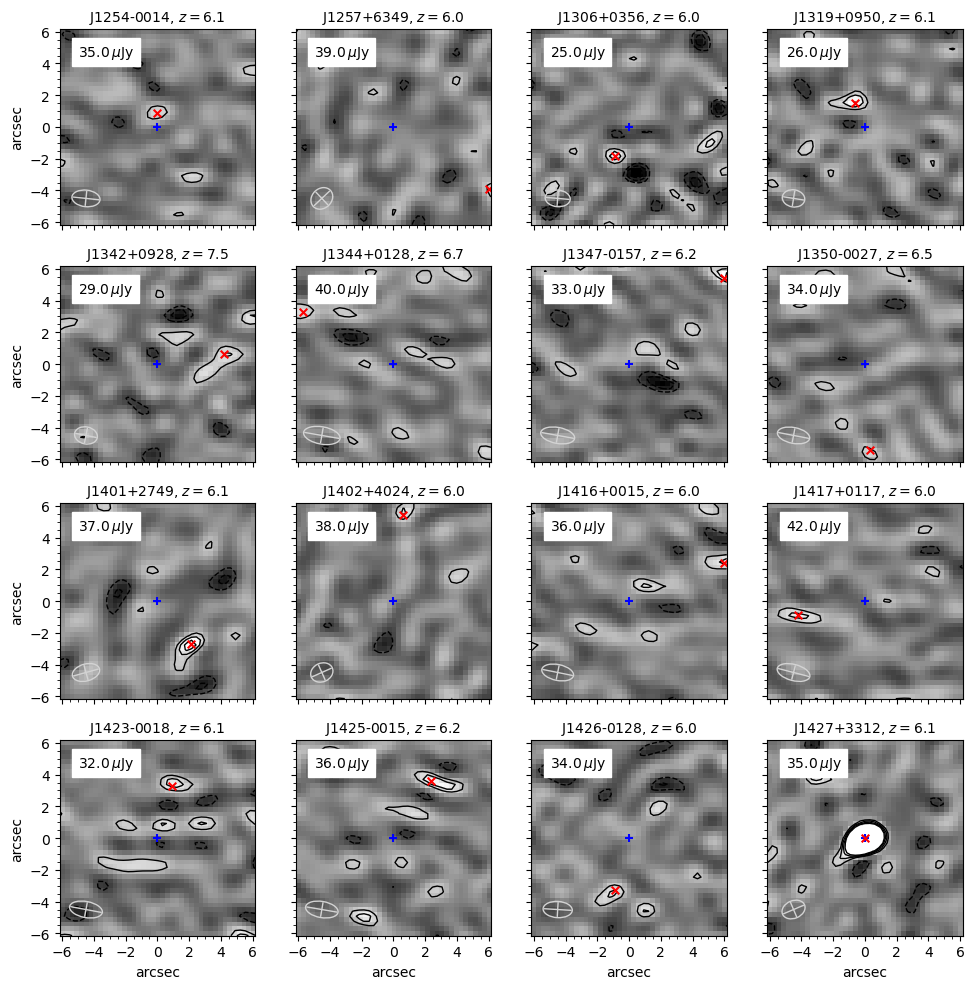

[-202. -162. -121.  -81.   81.  121.  162.  202.]
[-181. -145. -109.  -72.   72.  109.  145.  181.]
[-181. -145. -108.  -72.   72.  108.  145.  181.]
[-194. -156. -117.  -78.   78.  117.  156.  194.]
[-172. -137. -103.  -69.   69.  103.  137.  172.]
[-174. -139. -104.  -70.   70.  104.  139.  174.]
[-186. -149. -112.  -75.   75.  112.  149.  186.]
[-174. -139. -104.  -70.   70.  104.  139.  174.]
[-248. -198. -149.  -99.   99.  149.  198.  248.]
[-189. -151. -113.  -75.   75.  113.  151.  189.]
[-202. -162. -121.  -81.   81.  121.  162.  202.]
[-256. -205. -153. -102.  102.  153.  205.  256.]
[-182. -146. -109.  -73.   73.  109.  146.  182.]
[-195. -156. -117.  -78.   78.  117.  156.  195.]
[-180. -144. -108.  -72.   72.  108.  144.  180.]
[-196. -156. -117.  -78.   78.  117.  156.  196.]


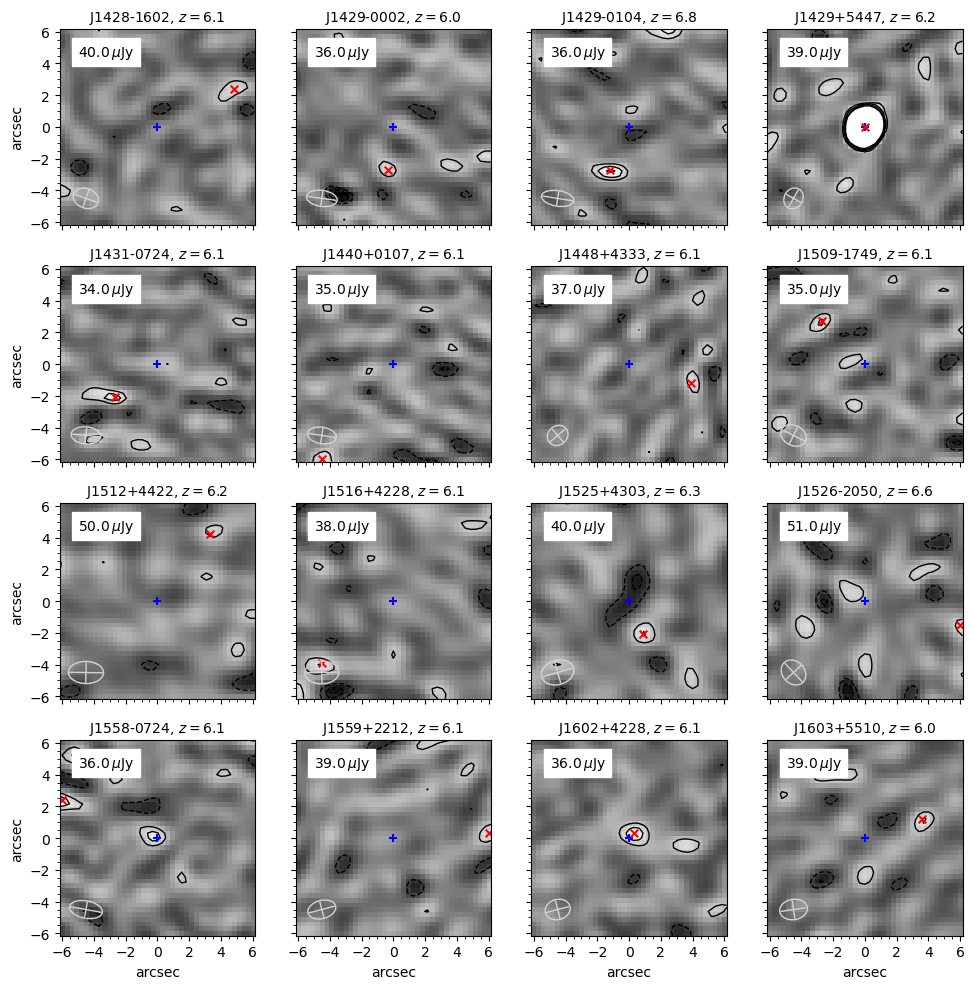

[-190. -152. -114.  -76.   76.  114.  152.  190.]
[-156. -125.  -94.  -62.   62.   94.  125.  156.]
[-200. -160. -120.  -80.   80.  120.  160.  200.]
[-161. -128.  -96.  -64.   64.   96.  128.  161.]
[-152. -121.  -91.  -61.   61.   91.  121.  152.]
[-178. -142. -107.  -71.   71.  107.  142.  178.]
[-169. -135. -101.  -68.   68.  101.  135.  169.]
[-159. -127.  -95.  -64.   64.   95.  127.  159.]
[-181. -144. -108.  -72.   72.  108.  144.  181.]
[-189. -151. -113.  -75.   75.  113.  151.  189.]
[-153. -122.  -92.  -61.   61.   92.  122.  153.]
[-184. -147. -111.  -74.   74.  111.  147.  184.]
[-134. -108.  -81.  -54.   54.   81.  108.  134.]
[-155. -124.  -93.  -62.   62.   93.  124.  155.]
[-208. -166. -125.  -83.   83.  125.  166.  208.]
[-162. -129.  -97.  -65.   65.   97.  129.  162.]


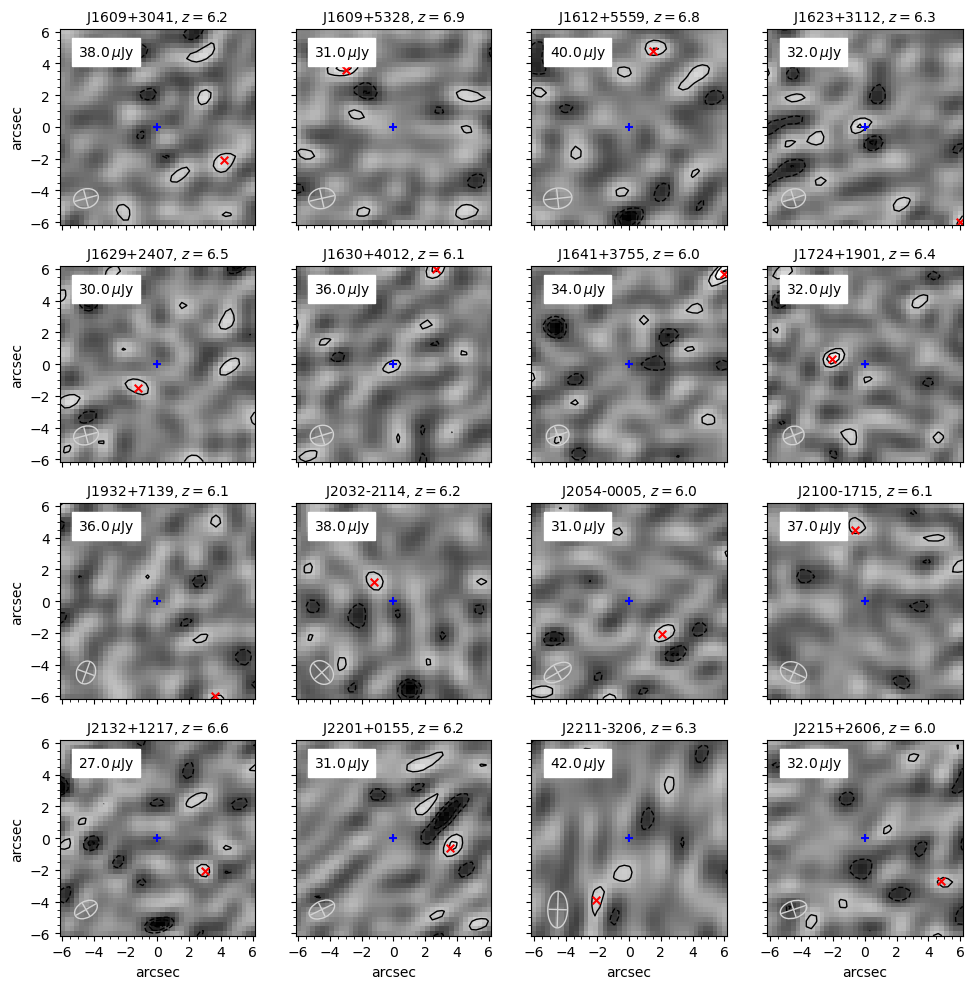

[-154. -124.  -93.  -62.   62.   93.  124.  154.]
[-181. -145. -109.  -73.   73.  109.  145.  181.]
[-157. -126.  -94.  -63.   63.   94.  126.  157.]
[-170. -136. -102.  -68.   68.  102.  136.  170.]
[-155. -124.  -93.  -62.   62.   93.  124.  155.]
[-170. -136. -102.  -68.   68.  102.  136.  170.]
[-166. -133.  -99.  -66.   66.   99.  133.  166.]
[-181. -145. -109.  -72.   72.  109.  145.  181.]
[-182. -145. -109.  -73.   73.  109.  145.  182.]
[-193. -154. -116.  -77.   77.  116.  154.  193.]
[-216. -173. -130.  -86.   86.  130.  173.  216.]
[-177. -142. -106.  -71.   71.  106.  142.  177.]
[-189. -151. -113.  -76.   76.  113.  151.  189.]
[-262. -210. -157. -105.  105.  157.  210.  262.]
[-253. -202. -152. -101.  101.  152.  202.  253.]
[-179. -143. -107.  -71.   71.  107.  143.  179.]


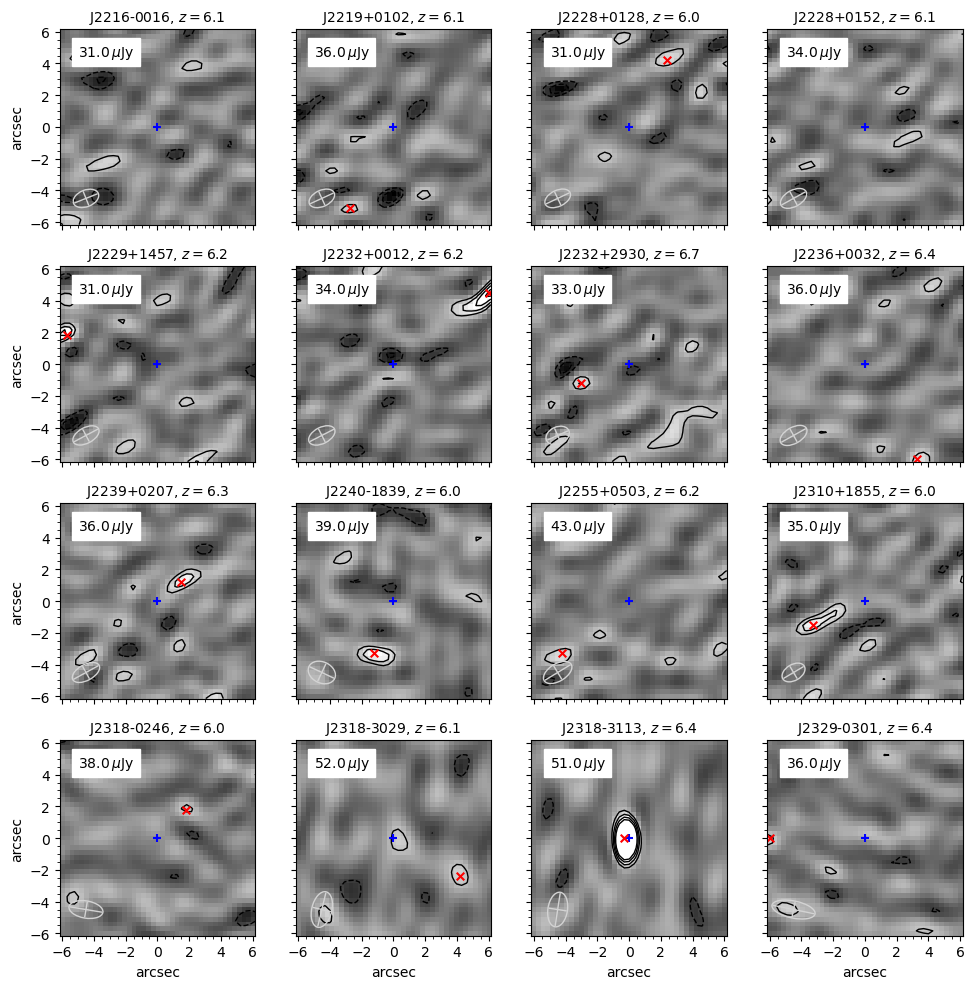

[-178. -143. -107.  -71.   71.  107.  143.  178.]
[-147. -118.  -88.  -59.   59.   88.  118.  147.]
[-189. -151. -113.  -75.   75.  113.  151.  189.]
[-211. -169. -126.  -84.   84.  126.  169.  211.]


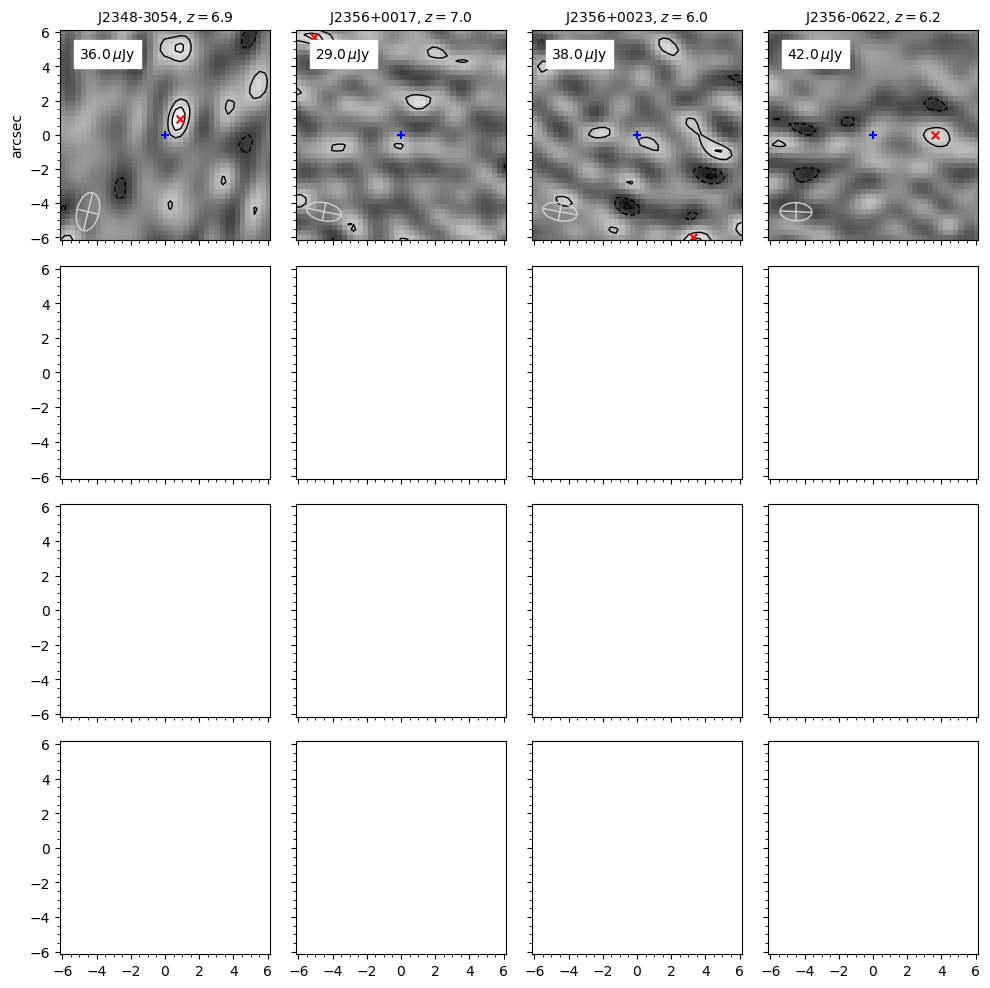

In [36]:

# Create a figure and axes

for k in range(9):
    fig, ax = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(10, 10))

    for i in range(16):
        if i + 16*k < images.shape[0]:
            im = images[i + 16*k]
            N = im.shape[0]
            mad = 1.4826 * np.median(np.abs(im - np.median(im)))
            
            # Display the image
            ax[i//4, i%4].imshow(im, cmap='gray', origin='lower', vmin=-4*mad, vmax=4*mad, extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]))

            # Add contours to the image
            contours_levels = [-5*mad, -4*mad, -3*mad, -2*mad, 2*mad, 3*mad, 4*mad, 5*mad] 
            print((np.array(contours_levels)*1e6).round(0))

            contours = ax[i//4, i%4].contour(im, levels=contours_levels, linestyles=None, linewidths=1, negative_linestyles="dashed", colors="k", extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]), zorder=1)

            max_x, max_y = np.unravel_index(np.argmax(im), im.shape)

            ax[i//4, i%4].scatter(0, 0, marker='+', color='b', s=30)
            ax[i//4, i%4].scatter((max_y-N//2)*0.3, (max_x-N//2)*0.3, marker='x', color='r', s=30)

            # Add labels and title
            if i//4 == 3:
                ax[i//4, i%4].set_xlabel('arcsec')
            if i%4 == 0:
                ax[i//4, i%4].set_ylabel('arcsec')
            ax[i//4, i%4].text(-5, 4.5, rf"${(mad*1e6).round(0)}\,\mu$Jy", backgroundcolor="white")
            ax[i//4, i%4].set_title(rf"{table2[0, i+16*k][4:]}, $z={table2[1, i+16*k].astype(float).round(1)}$", fontsize=10)
            ax[i//4, i%4].minorticks_on()
            ax[i//4, i%4].set_xticks(np.arange(-6, 8, 2))
            ax[i//4, i%4].set_yticks(np.arange(-6, 8, 2))
            
            # add restoring beam
            ell = Ellipse(xy=[-4.5, -4.5], width=bmax_list[i+16*k] * 3600, height=bmin_list[i+16*k] * 3600, angle=90+pa_list[i+16*k], facecolor='none', edgecolor='lightgray')
            ax[i//4, i%4].add_artist(ell)

            # math for the start and end axis point positions
            pad=0.1
            ax1_points = [
                (-4.5+(bmax_list[i+16*k]*3600/2+pad)*cos(radians(90+pa_list[i+16*k])), 
                -4.5+(bmax_list[i+16*k]*3600/2+pad)*sin(radians(90+pa_list[i+16*k]))),
                (-4.5+(bmax_list[i+16*k]*3600/2+pad)*cos(radians(90+pa_list[i+16*k] + 180)), 
                -4.5+(bmax_list[i+16*k]*3600/2+pad)*sin(radians(90+pa_list[i+16*k] + 180)))]
            ax2_points = [
                (-4.5+(bmin_list[i+16*k]*3600/2+pad)*cos(radians(90+pa_list[i+16*k]+90)), 
                -4.5+(bmin_list[i+16*k]*3600/2+pad)*sin(radians(90+pa_list[i+16*k]+90))),
                (-4.5+(bmin_list[i+16*k]*3600/2+pad)*cos(radians(90+pa_list[i+16*k] + 270)), 
                -4.5+(bmin_list[i+16*k]*3600/2+pad)*sin(radians(90+pa_list[i+16*k] + 270)))]

            # ax1 and ax2 contains the start and the end point of the axis ([x,y] format)

            # drawing the arrows
            arrowprops=dict(arrowstyle="-", color="lightgray")
            ax[i//4, i%4].annotate("", xy=ax1_points[0], xytext=ax1_points[1], arrowprops=arrowprops)
            ax[i//4, i%4].annotate("", xy=ax2_points[0], xytext=ax2_points[1], arrowprops=arrowprops)

    plt.tight_layout()
    plt.savefig(f"../../plots/small_im_{k}.pdf")

    # Show the plot
    plt.show()


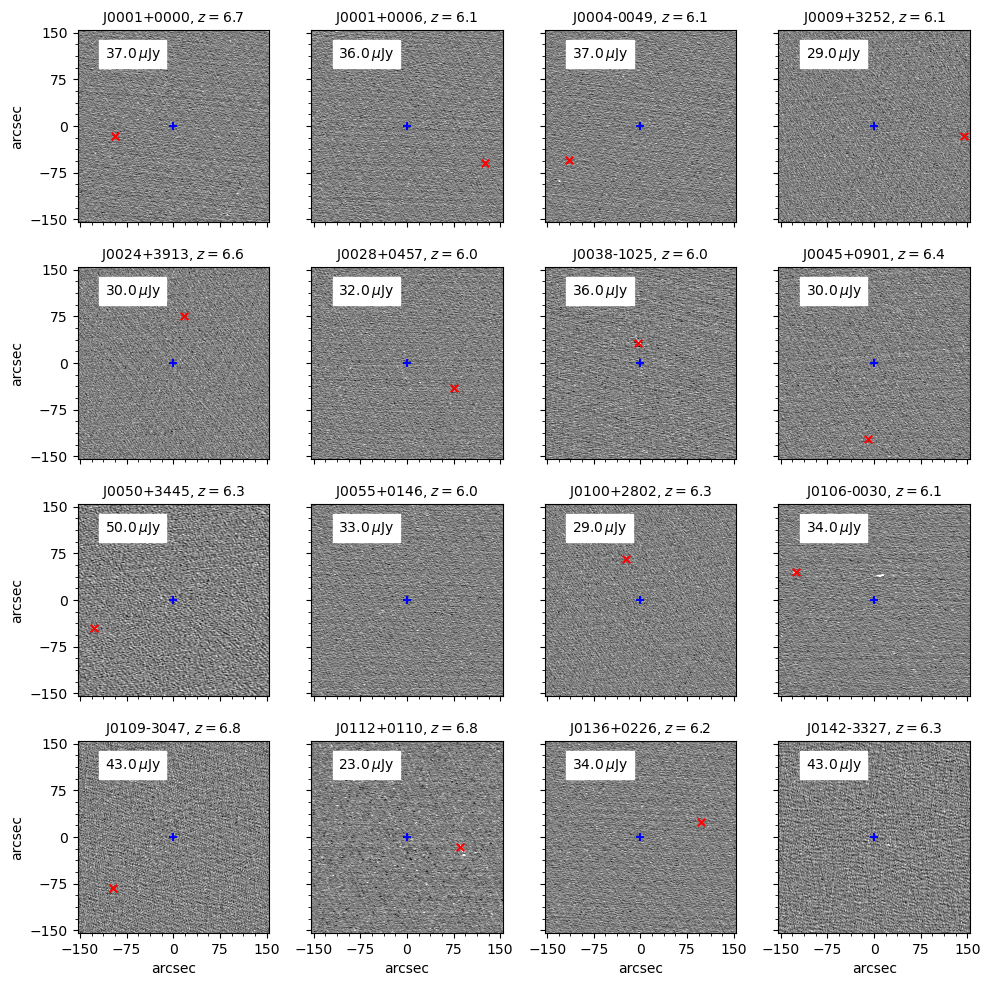

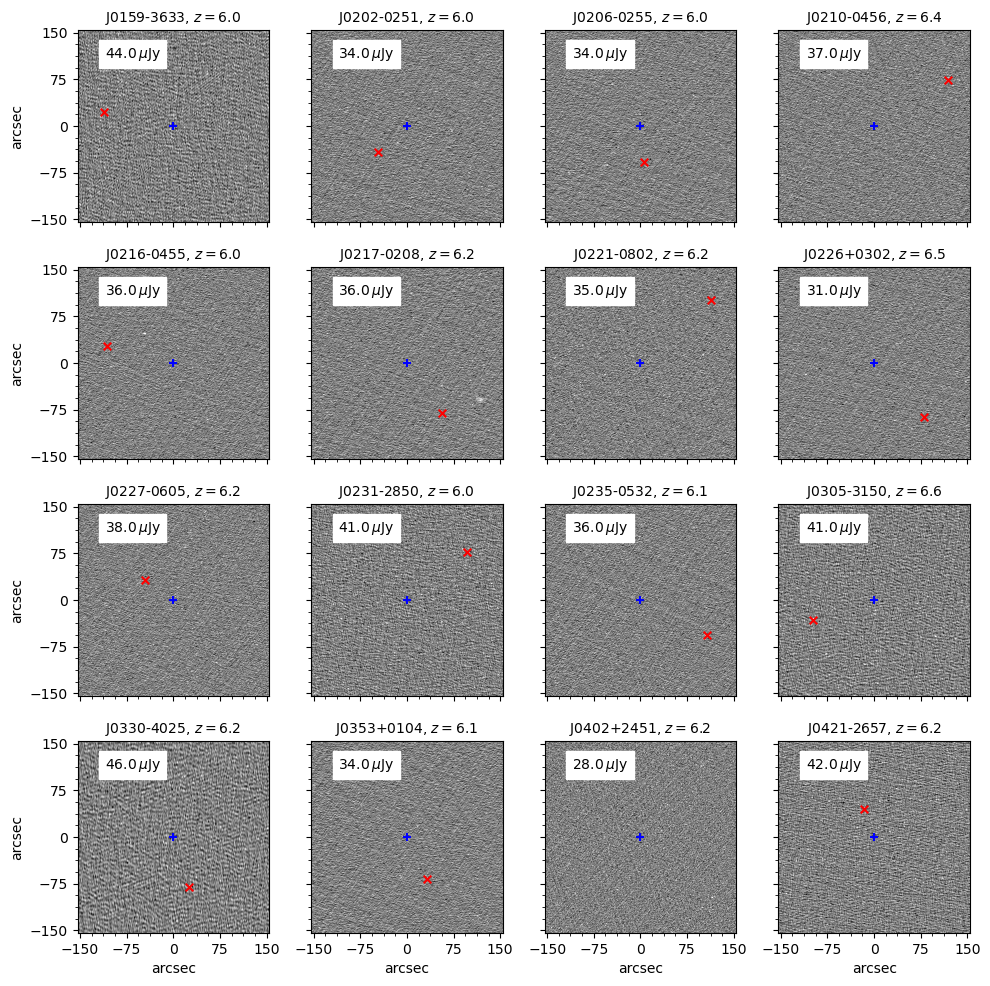

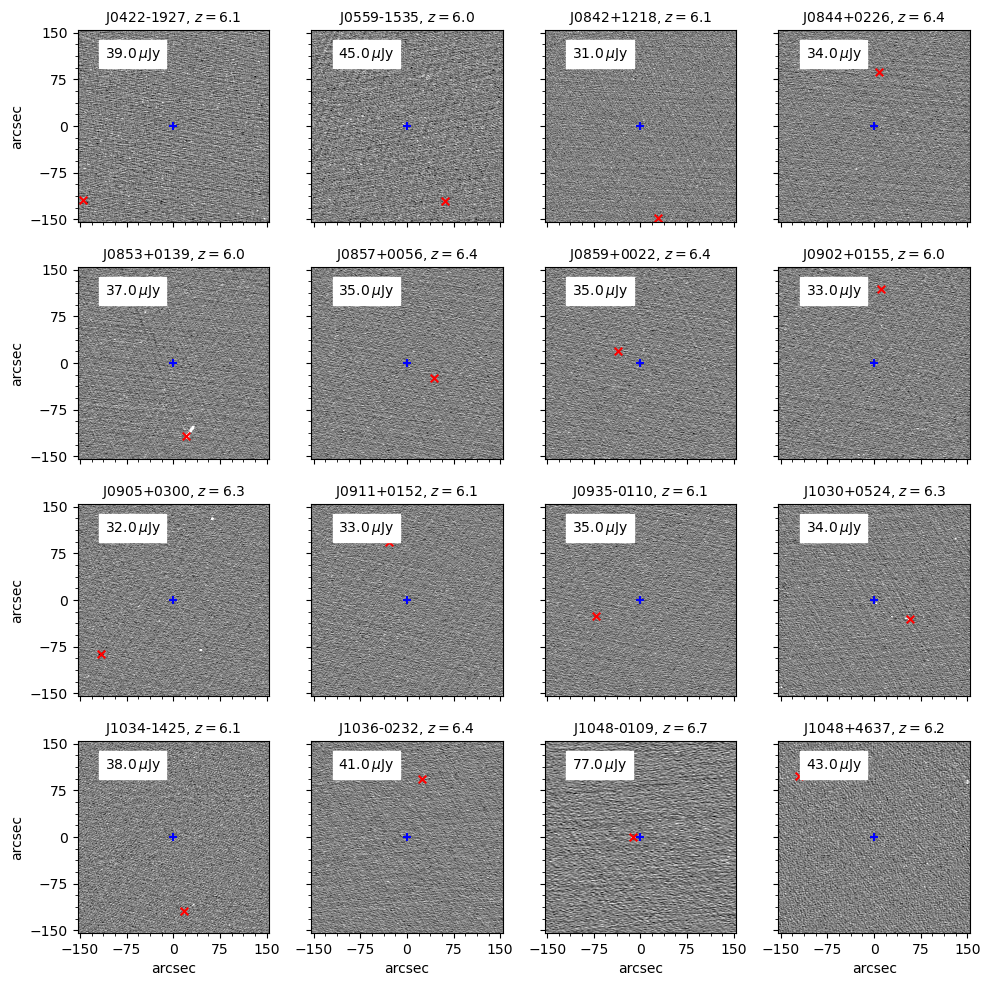

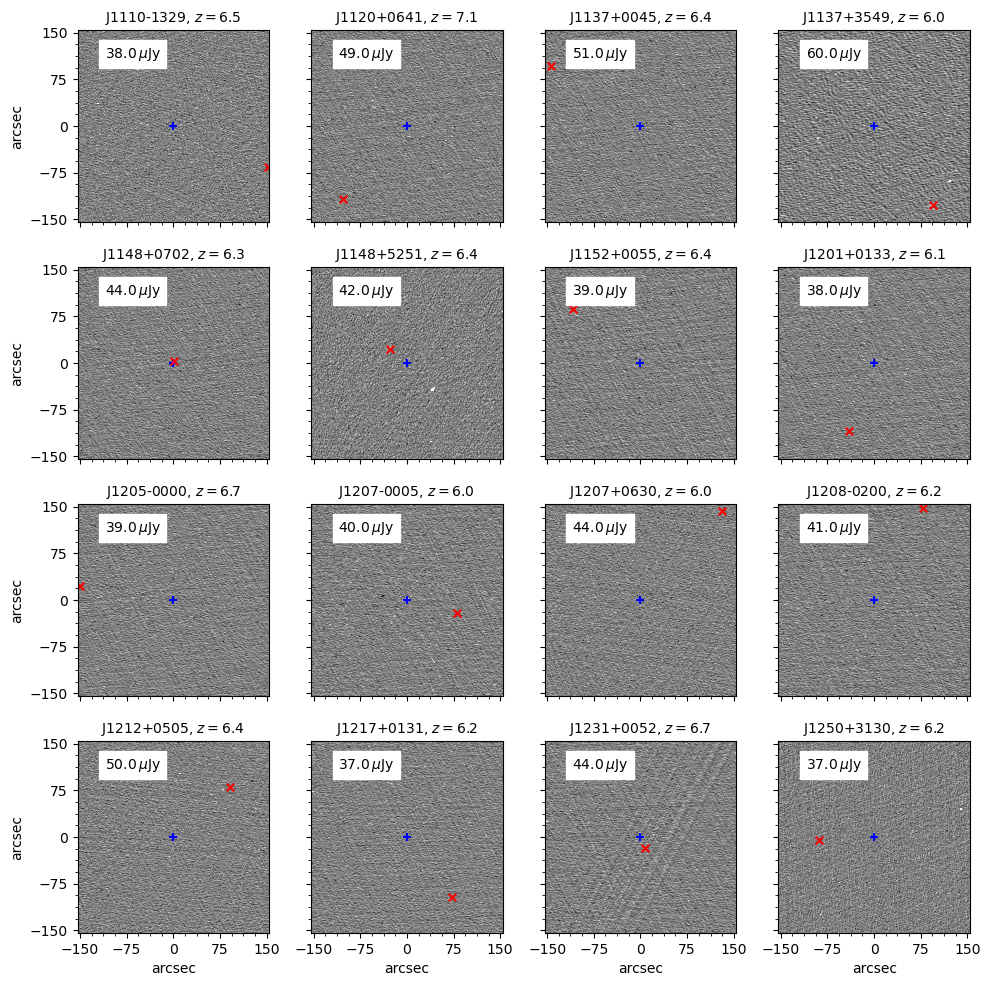

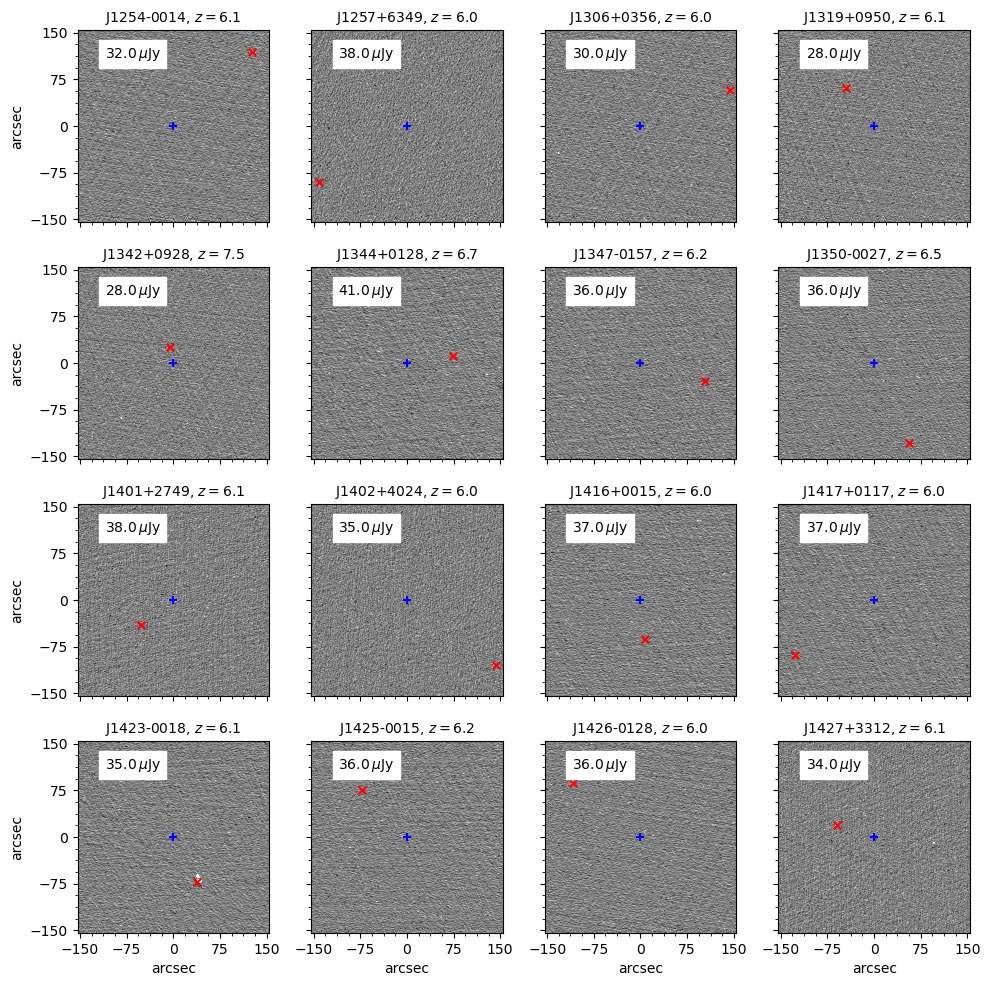

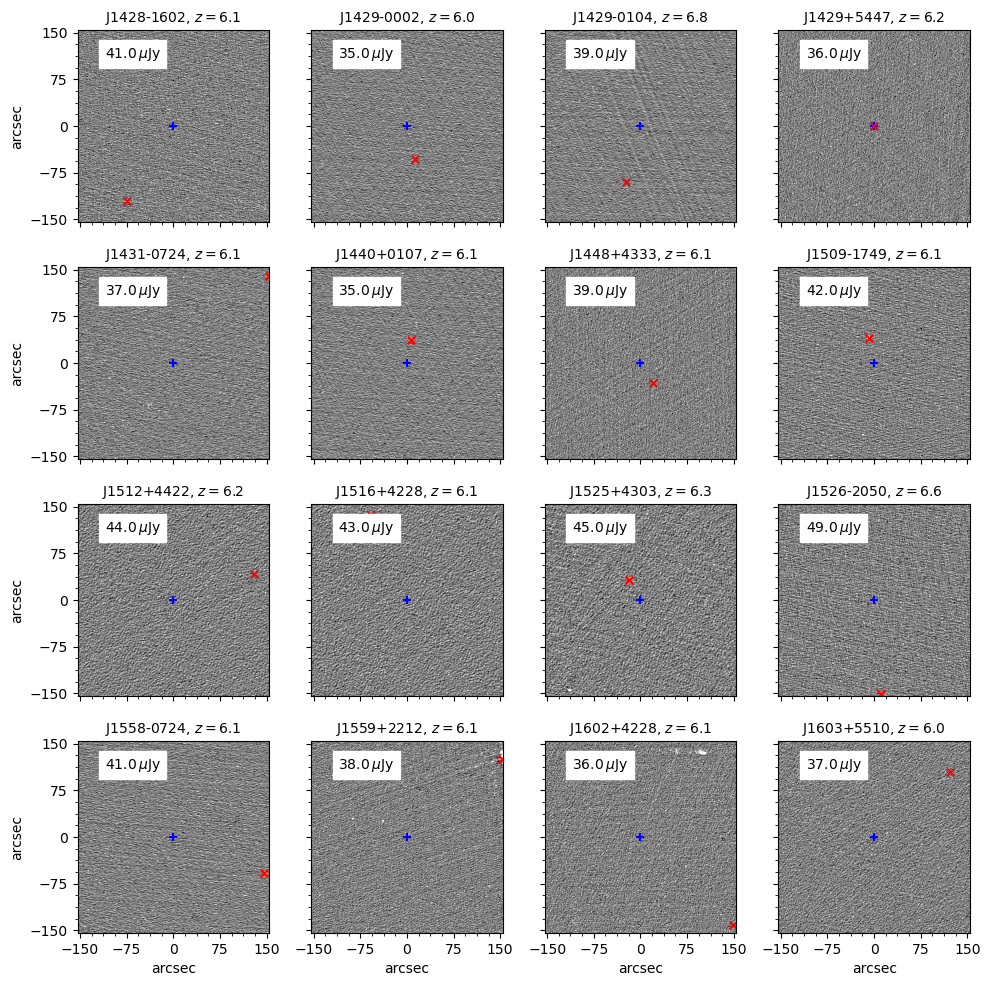

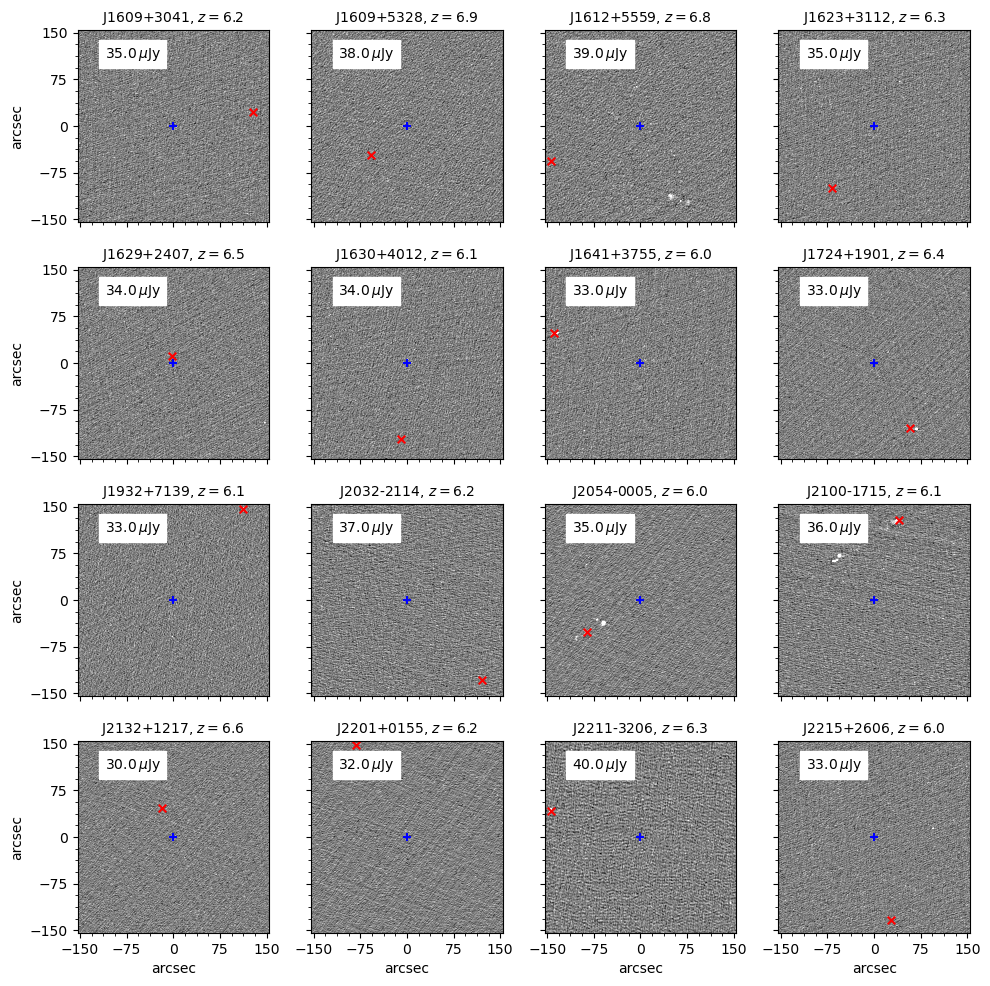

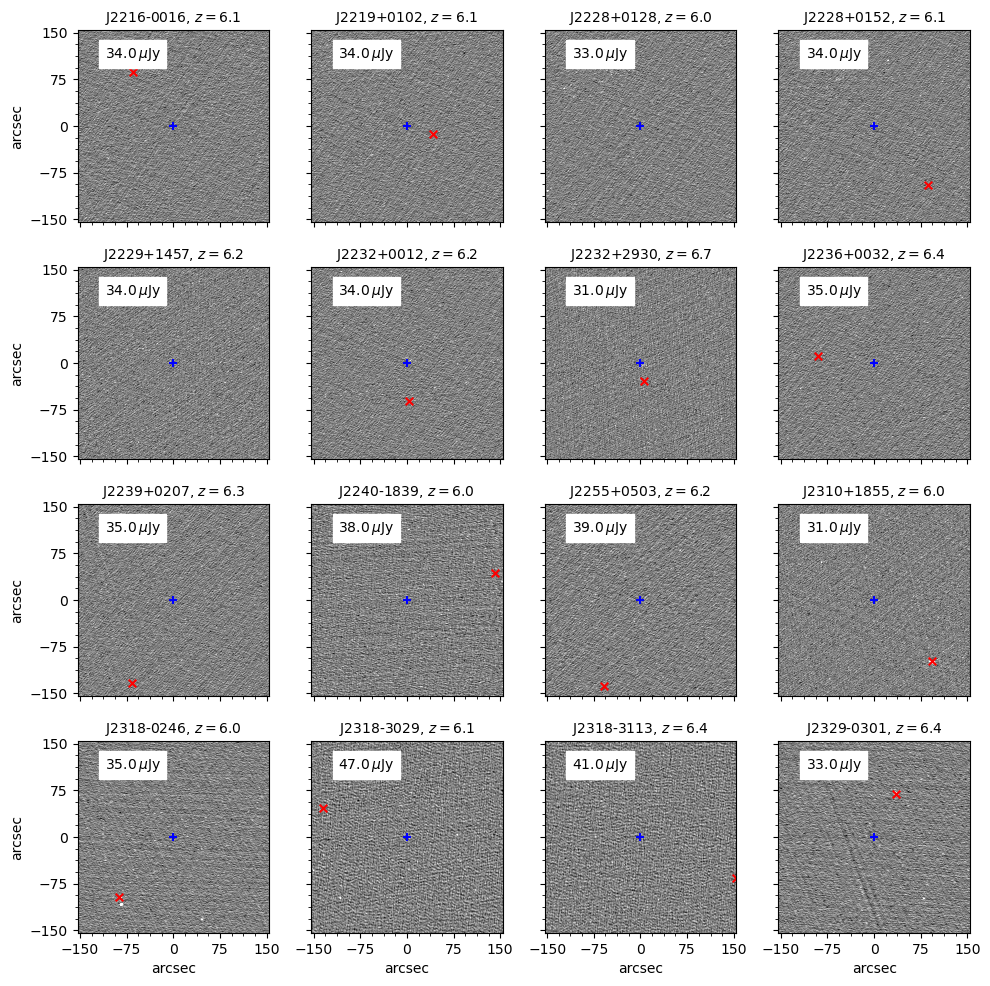

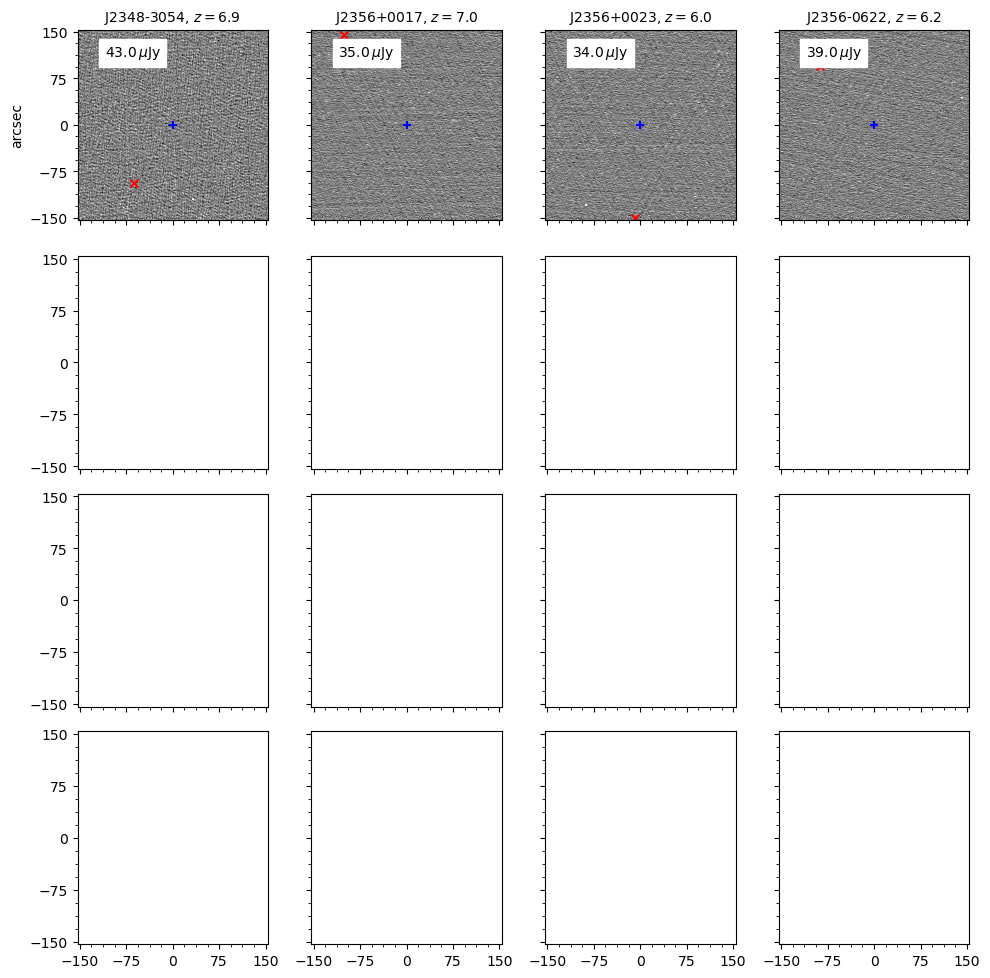

In [20]:

# Create a figure and axes

for k in range(9):
    fig, ax = plt.subplots(4, 4, sharex=True, sharey=True, figsize=(10, 10))

    for i in range(16):
        if i + 16*k < images.shape[0]:
            im = images_large[i + 16*k]
            N = im.shape[0]
            mad = 1.4826 * np.median(np.abs(im - np.median(im)))
            
            # Display the image
            ax[i//4, i%4].imshow(im, cmap='gray', origin='lower', vmin=-3*mad, vmax=3*mad, extent=N/2 * 0.3 * np.array([-1, 1, -1, 1]))

            max_x, max_y = np.unravel_index(np.argmax(im), im.shape)

            ax[i//4, i%4].scatter(0, 0, marker='+', color='b', s=30)
            ax[i//4, i%4].scatter((max_y-N//2)*0.3, (max_x-N//2)*0.3, marker='x', color='r', s=30)

            # Add labels and title
            if i//4 == 3:
                ax[i//4, i%4].set_xlabel('arcsec')
            if i%4 == 0:
                ax[i//4, i%4].set_ylabel('arcsec')
            ax[i//4, i%4].text(-110, 110, rf"${(mad*1e6).round(0)}\,\mu$Jy", backgroundcolor="white")
            ax[i//4, i%4].set_title(rf"{table2[0, i+16*k][4:]}, $z={table2[1, i+16*k].astype(float).round(1)}$", fontsize=10)
            ax[i//4, i%4].set_xticks(np.arange(-150, 200, 75))
            ax[i//4, i%4].set_yticks(np.arange(-150, 200, 75))
            ax[i//4, i%4].minorticks_on()

    plt.tight_layout()
    plt.savefig(f"../../plots/large_im_{k}.pdf")

    # Show the plot
    plt.show()
